In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import sklearn
from sklearn.preprocessing import StandardScaler
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.statespace.sarimax import SARIMAX
import pmdarima as pm
import statsmodels.api as sm
import plotly.graph_objects as go

In [52]:
def train_test(data, test_size = 0.15, scale = False, cols_to_transform=None, include_test_scale=False):
    """
    
        Perform train-test split with respect to time series structure
        
        - df: dataframe with variables X_n to train on and the dependent output y which is the column 'SDGE' in this notebook
        - test_size: size of test set
        - scale: if True, then the columns in the -'cols_to_transform'- list will be scaled using StandardScaler
        - include_test_scale: If True, the StandardScaler fits the data on the training as well as the test set; if False, then
          the StandardScaler fits only on the training set.
        
    """
    df = data.copy()
    # get the index after which test set starts
    test_index = int(len(df)*(1-test_size))
    
    # StandardScaler fit on the entire dataset
    if scale and include_test_scale:
        scaler = StandardScaler()
        df[cols_to_transform] = scaler.fit_transform(df[cols_to_transform])
        
    X_train = df.drop('MWh', axis = 1).iloc[:test_index]
    y_train = df.MWh.iloc[:test_index]
    X_test = df.drop('MWh', axis = 1).iloc[test_index:]
    y_test = df.MWh.iloc[test_index:]
    
    # StandardScaler fit only on the training set
    if scale and not include_test_scale:
        scaler = StandardScaler()
        X_train[cols_to_transform] = scaler.fit_transform(X_train[cols_to_transform])
        X_test[cols_to_transform] = scaler.transform(X_test[cols_to_transform])
    
    return X_train, X_test, y_train, y_test


In [2]:
def plot_timeseries(ts, title = 'og', opacity = 1):
    """
    Plot plotly time series of any given timeseries ts
    """
    fig = go.Figure()

    fig.add_trace(go.Scatter(x = ts.index, y = ts.values, name = "observed",
                         line_color = 'lightslategrey', opacity = opacity))

    fig.update_layout(title_text = title,
                  xaxis_rangeslider_visible = True)
    fig.show()

In [3]:
tx_df = pd.read_csv('texasdata/texas_2009_to_2019_dataset.csv', index_col = 'Date',  parse_dates=['Date'])

In [4]:
tx_df.head()

,MWh,uvIndex,HeatIndexC,WindChillC,humidity,tempC
Date,,,,,,
2009-01-01 01:00:00,809.370368,4,8,7,57,7
2009-01-01 02:00:00,801.758344,4,8,7,58,7
2009-01-01 03:00:00,796.833243,4,8,7,60,7
2009-01-01 04:00:00,802.548898,4,8,7,62,7
2009-01-01 05:00:00,814.159655,4,8,7,63,7


In [5]:
#Creating a simple time series dataframe
ts_txdf = pd.DataFrame(tx_df["MWh"], columns=['MWh'])

In [6]:
ts_txdf.tail()

,MWh
Date,
2019-12-31 19:00:00,829.983729
2019-12-31 20:00:00,825.761799
2019-12-31 21:00:00,822.190573
2019-12-31 22:00:00,819.394012
2019-12-31 23:00:00,804.714775


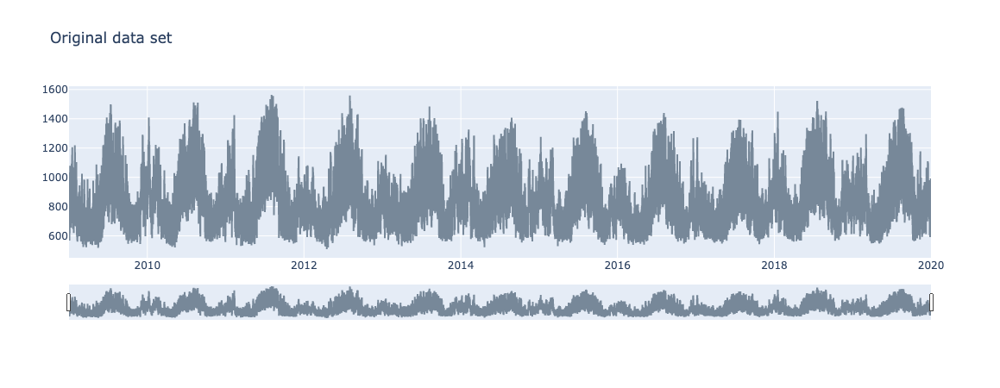

In [7]:
plot_timeseries(ts_txdf['MWh'], title = 'Original data set')

In [8]:
from statsmodels.graphics import tsaplots

In [9]:
import statsmodels.api as sm

Date
2009-01-01 01:00:00   -23.495449
2009-01-01 02:00:00   -26.170745
2009-01-01 03:00:00   -25.744397
2009-01-01 04:00:00   -17.523183
2009-01-01 05:00:00    -2.300566
Name: seasonal, dtype: float64


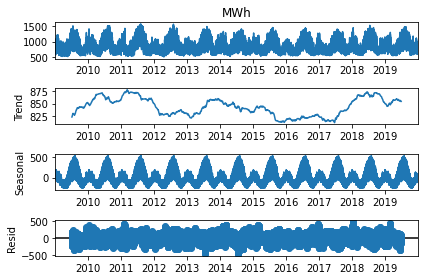

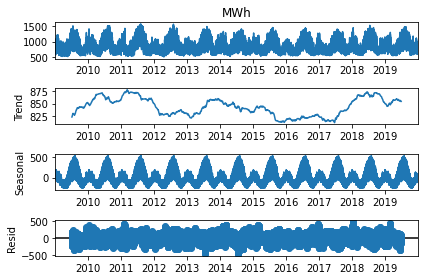

In [15]:
# Run seasonal decompose
decomp = sm.tsa.seasonal_decompose(ts_txdf['MWh'], period=24*365)
print(decomp.seasonal.head())
decomp.plot()

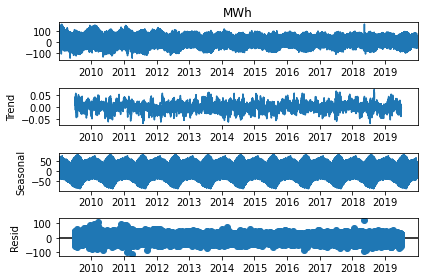

In [17]:
# Differencing the data once to remove trend 

decomp_diff1 = sm.tsa.seasonal_decompose(ts_txdf['MWh'].diff().dropna(), period=24*365) 
_ = decomp_diff1.plot()

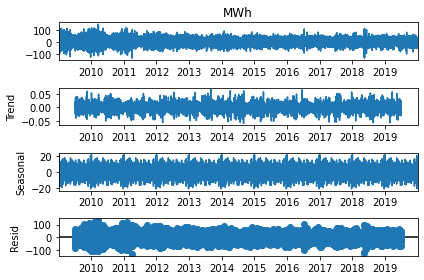

In [19]:
# Differencing the data with periodicity of 24 hours in addition to the original single differencing
# to remove seasonality and trend

decomp_diff24 = sm.tsa.seasonal_decompose(ts_txdf['MWh'].diff().dropna().diff(24).dropna(), period=24*365) 
_ = decomp_diff24.plot()

In [20]:
from statsmodels.tsa.stattools import adfuller

In [21]:
def run_adfuller(ts):
    result = adfuller(ts)
    # Print test statistic
    print("t-stat", result[0])
    # Print p-value
    print("p-value", result[1])
    # Print #lags used
    print("#lags used", result[2])
    # Print critical values
    print("critical values", result[4]) 

In [23]:
# Run Dicky Fuller to check for stationarity 
# Check if pvalues change for differences
print("for no differencing\n")
run_adfuller(ts_txdf['MWh'])
print("\nfor single differencing\n")
run_adfuller(ts_txdf['MWh'].diff().dropna())
print("\nfor differenced data set over lags 24 after single differencing\n")
run_adfuller(ts_txdf['MWh'].diff().dropna().diff(24).dropna())

for no differencing

t-stat -11.244900906696527
p-value 1.769534575356312e-20
#lags used 67
critical values {'1%': -3.430417880527406, '5%': -2.8615700021170647, '10%': -2.5667859690792603}

for single differencing

t-stat -52.84920059722407
p-value 0.0
#lags used 67
critical values {'1%': -3.43041788123204, '5%': -2.8615700024284982, '10%': -2.566785969245026}

for differenced data set over lags 24 after single differencing

t-stat -53.93281506815336
p-value 0.0
#lags used 67
critical values {'1%': -3.4304178981476485, '5%': -2.861570009904843, '10%': -2.5667859732244382}


In [24]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

In [30]:
def acf_pacf_plots(ts, lags, figsize = (12,8)):
    
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize = figsize)
    
    # Plot the ACF of ts
    _ = plot_acf(ts, lags = lags, zero = False, ax = ax1, alpha = 0.05)

    # Plot the PACF of ts
    _ = plot_pacf(ts, lags = lags, zero = False, ax = ax2, alpha = 0.05)

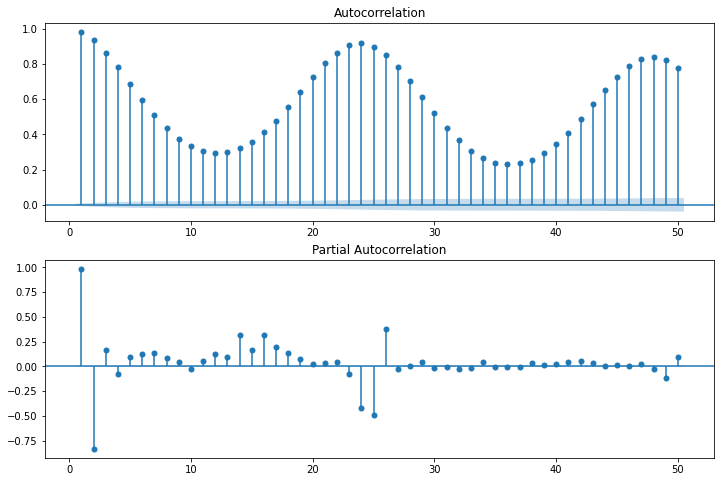

In [31]:
# Create the acf and pacf plots

dfacf = []
dfacf = ts_txdf['MWh']
lags = 50

acf_pacf_plots(dfacf, lags = lags, figsize = (12,8))

Seasonal period of 24 hours can be observed 

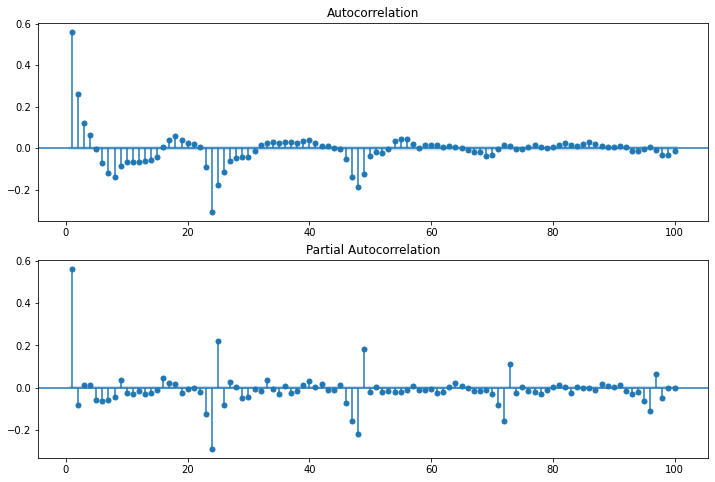

In [32]:
# Differencing the data this time to remove the trend and seasonality
dfacf = []
dfacf = ts_txdf['MWh']
dfacf = dfacf.diff().dropna() 
dfacf = dfacf.diff(24).dropna()
dfacf = dfacf.diff(24*365).dropna()
lags = 100

acf_pacf_plots(dfacf, lags = lags, figsize = (12,8))


In [33]:
import warnings
warnings.filterwarnings('ignore')

# We can add multiple fourer series with different k terms in the (2*k*pi) such as k=1,2,3...etc. To generalize the problem, 
# we could have chosen an optimal k value for each season by trying out some k values and choosing the values giving 
#the lowest AIC.

def add_fourier_terms(df, year_k, week_k, day_k):
    """
    df: dataframe to add the fourier terms to 
    year_k: the number of Fourier terms the year period should have. Thus the model will be fit on 2*year_k terms (1 term for 
    sine and 1 for cosine)
    week_k: same as year_k but for weekly periods
    day_k:same as year_k but for daily periods
    """
    
    for k in range(1, year_k+1):
        # year has a period of 365.25 including the leap year
        df['year_sin'+str(k)] = np.sin(2 *k* np.pi * df.index.dayofyear/365.25) 
        df['year_cos'+str(k)] = np.cos(2 *k* np.pi * df.index.dayofyear/365.25)

    for k in range(1, week_k+1):
        
        # week has a period of 7
        df['week_sin'+str(k)] = np.sin(2 *k* np.pi * df.index.dayofweek/7)
        df['week_cos'+str(k)] = np.cos(2 *k* np.pi * df.index.dayofweek/7)


    for k in range(1, day_k+1):
        
        # day has period of 24
        df['hour_sin'+str(k)] = np.sin(2 *k* np.pi * df.index.hour/24)
        df['hour_cos'+str(k)] = np.cos(2 *k* np.pi * df.index.hour/24) 

In [34]:
ts_txdf.index.hour

Int64Index([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10,
            ...
            14, 15, 16, 17, 18, 19, 20, 21, 22, 23],
           dtype='int64', name='Date', length=96406)

In [36]:
warnings.filterwarnings('ignore')

# as said above the k terms for each yearly, weekly and daily seasonalities could be chosen by optimizing on the AIC values..
# but after some research on energy consumption time series k= 5 was chosen for each seasonality
add_fourier_terms(ts_txdf, year_k= 5, week_k=5 , day_k=5)

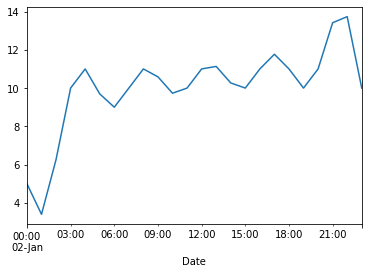

In [37]:
pd.plotting.register_matplotlib_converters()
_ = (1-ts_txdf.loc['01-02-2014':'01-02-2014', [col for col in ts_txdf if col.startswith('hour')]]).sum(axis = 1).plot()

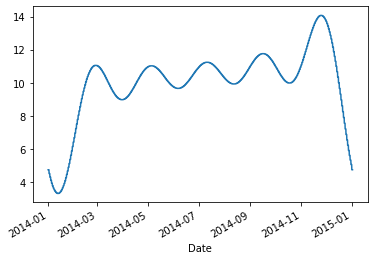

In [38]:
# Visualizing the new variables on year seasonality
_ = (1-ts_txdf.loc['01-01-2014':'01-01-2015', [col for col in ts_txdf if col.startswith('year')]]).sum(axis = 1).plot()

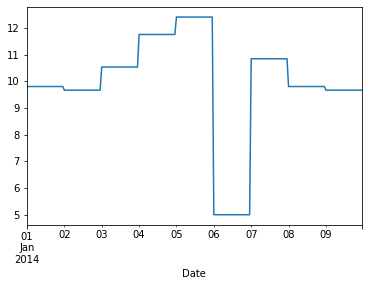

In [39]:
# Visualizing the new variables on week seasonality
_ = (1-ts_txdf.loc['01-01-2014':'01-09-2014', [col for col in ts_txdf if col.startswith('week')]]).sum(axis = 1).plot()

In [40]:
ts_txdf.columns

Index(['MWh', 'year_sin1', 'year_cos1', 'year_sin2', 'year_cos2', 'year_sin3',
       'year_cos3', 'year_sin4', 'year_cos4', 'year_sin5', 'year_cos5',
       'week_sin1', 'week_cos1', 'week_sin2', 'week_cos2', 'week_sin3',
       'week_cos3', 'week_sin4', 'week_cos4', 'week_sin5', 'week_cos5',
       'hour_sin1', 'hour_cos1', 'hour_sin2', 'hour_cos2', 'hour_sin3',
       'hour_cos3', 'hour_sin4', 'hour_cos4', 'hour_sin5', 'hour_cos5'],
      dtype='object')

In [42]:
ts_txdfcyc = ts_txdf.drop([col for col in ts_txdf if 
                         col.startswith('time') or col.startswith('season') or col.startswith('lag')], axis=1)

In [43]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

In [44]:
import pmdarima as pm

In [45]:
ts_txdfcyc.columns

Index(['MWh', 'year_sin1', 'year_cos1', 'year_sin2', 'year_cos2', 'year_sin3',
       'year_cos3', 'year_sin4', 'year_cos4', 'year_sin5', 'year_cos5',
       'week_sin1', 'week_cos1', 'week_sin2', 'week_cos2', 'week_sin3',
       'week_cos3', 'week_sin4', 'week_cos4', 'week_sin5', 'week_cos5',
       'hour_sin1', 'hour_cos1', 'hour_sin2', 'hour_cos2', 'hour_sin3',
       'hour_cos3', 'hour_sin4', 'hour_cos4', 'hour_sin5', 'hour_cos5'],
      dtype='object')

In [48]:
# The code below can be used to train and find the optimal SARIMAX model parameters p,q,P,Q. 
# This was run and the optimal model was found to be SARIMAX(2,1,1)x(1,0,1,24). The auto regressive term p=2 means two values 
# from the past (1 and 2 hours behind) will be used and moving average term of q=1 means 1 past term will be used as the moving #average term . d=1 term means the energy series will differenced once. Seasonal period m of 24 hours here and P=Q=1 means the auto regressive term (P) and the moving average (Q) of 
# exactly 1*24 hours behind will be used. 
# results = pm.auto_arima(y_train_lag, 
# data d=1, 
# non-seasonal difference order start_p=0, 
# initial guess for p start_q=0, 
# initial guess for q max_p=2, 
# max value of p to test max_q=2, exogenous= X_train_lag, 
#including the exogenous variables seasonal=True, 
# is the time series seasonal m=24, 
# the seasonal period #D=1, 
# seasonal difference order start_P=1, 
# initial guess for P start_Q=1, 
# initial guess for Q max_P=1, 
# max value of P to test max_Q=1, 
# max value of Q to test information_criterion='aic', 
# used to select best model trace=True, 
# print results whilst training error_action='ignore', 
# ignore orders that don't work stepwise=True, 
# apply intelligent order search ) 
#results.fit(y_train_lag, exogenous= X_train_lag)



In [53]:
X_train_lag, X_test_lag, y_train_lag, y_test_lag = train_test(ts_txdfcyc, 
                                                              test_size = 0.15, scale = False, 
                                                              cols_to_transform=None)

scaler1 = StandardScaler()
y_train_lag = pd.DataFrame(scaler1.fit_transform(y_train_lag.values.reshape(-1,1)), index = y_train_lag.index, 
                           columns = ['MWh'])

In [ ]:
import itertools
p = range(0, 3)
d = range(1,2)
q = range(0, 3)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 24) for x in list(itertools.product(p, d, q))]
print('Examples of parameter combinations for Seasonal ARIMA...')
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[1]))
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[2]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[3]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[4]))

for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(y_train_lag,
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)
            results = mod.fit()
            print('ARIMA{}x{}24 - AIC:{}'.format(param, param_seasonal, results.aic))
        except:
            continue

Examples of parameter combinations for Seasonal ARIMA...
SARIMAX: (0, 1, 1) x (0, 1, 1, 24)
SARIMAX: (0, 1, 1) x (0, 1, 2, 24)
SARIMAX: (0, 1, 2) x (1, 1, 0, 24)
SARIMAX: (0, 1, 2) x (1, 1, 1, 24)
ARIMA(0, 1, 0)x(0, 1, 0, 24)24 - AIC:-171498.73395111665
ARIMA(0, 1, 0)x(0, 1, 2, 24)24 - AIC:-194795.16461854603


In [54]:
results = pm.auto_arima(y_train_lag, d=1, start_p=0, start_q=0, max_p=2, max_q=2, exogenous=X_train_lag, seasonal=True, m=24, D=1, start_P=1, start_Q=1, max_P=1, max_Q=1, information_criterion='aic', trace=True, errpr_action='ignore', stepwise=True)

Performing stepwise search to minimize aic


KeyboardInterrupt: 